# Notebook Structure

1. Problem Statement and Data Description
2. Loading Datasets and Libraries
3. EDA Assignment

# 1. Problem Statement and Data Description

**Problem Statement:** 
Prevent overstocking and understocking of Items by forecasting demand of items for the next week, based on historical data.
<br>

<center><img src ='https://drive.google.com/uc?export=view&id=1sOypUBaijZCFv8h3wRjmRze0tfrSAN3z'></center>






**Data Description:**

Train Data- 
- **WEEK_END_DATE** - week ending date
- **STORE_NUM** - store number
- **UPC** - (Universal Product Code) product specific identifier
- **PRICE** - price of item
- **BASE_PRICE** - base price of item
- **DISPLAY** - product was a part of in-store promotional display
- **FEATURE** - product was in in-store circular
- **UNITS** - units sold (target)

Product Data-
- **UPC** - (Universal Product Code) product specific identifier
- **DESCRIPTION**	- product description
- **MANUFACTURER** - product	manufacturer
- **CATEGORY** - category of product
- **SUB_CATEGORY** - sub-category of product
- **PRODUCT_SIZE** - package size or quantity of product

Store Data-
- **STORE_ID** - store number
- **STORE_NAME** - Name of store
- **ADDRESS_CITY_NAME** - city
- **ADDRESS_STATE_PROV_CODE** - state
- **MSA_CODE** - (Metropolitan Statistical Area) Based on geographic region and population density
- **SEG_VALUE_NAME** - Store Segment Name
- **PARKING_SPACE_QTY** - number of parking spaces in the store parking lot
- **SALES_AREA_SIZE_NUM** - square footage of store
- **AVG_WEEKLY_BASKETS** - average weekly baskets sold in the store

“cardinality” refers to the number of possible values that a feature can assume.

High-cardinality refers to columns with values that are very uncommon or unique.


# 2. Loading Required Libraries and Datasets

In [1]:
import seaborn as sns
import pandas as pd
import numpy as np
import random

sns.set_context('notebook',font_scale=1.5)

import matplotlib.pyplot as plt


import warnings
warnings.filterwarnings("ignore")

We are provided with three tables containing the required information:

- **product_data**: Consists of details about the product
- **store_data**: Consists of details of various stores associated with the retailer  
- **train**: Contains transaction data of products

In [2]:
from google.colab import drive 
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [3]:
# reading the data files
train = pd.read_csv('gdrive/My Drive/Colab Notebooks/vidhya/EDA_Datasets_Notebooks/train.csv')
product_data = pd.read_csv('gdrive/My Drive/Colab Notebooks/vidhya/EDA_Datasets_Notebooks/product_data.csv')
store_data = pd.read_csv('gdrive/My Drive/Colab Notebooks/vidhya/EDA_Datasets_Notebooks/store_data.csv')

In [4]:
# checking the size of the dataframes
train.shape, product_data.shape, store_data.shape

((232287, 8), (30, 6), (76, 9))

##### WEEK_END_DATE - Convert into the date time format


In [5]:
# convert into the date time format
train['WEEK_END_DATE'] = pd.to_datetime(train['WEEK_END_DATE'])

# 3. EDA Assignment
1. Does the 'Display' have more impact on demand than 'Feature' or is it the other way round?
2. Does the number of unique manufacturers for a category & subcategory (Bag snacks, Frozen Pizza etc.) impact the demand?
3.  One hypothesis you think should be tested with the given dataset. Demonstrate with plots.


### 3.1 Does the 'Display' have more impact on demand than 'Feature' or is it the other way round?

In [6]:
def display_plots(product_list):
    d_d = {product: 1000*train[train['UPC'] == product].groupby(['WEEK_END_DATE'])['DISPLAY'].mean() for product in product_list}
    d = {product: train[train['UPC'] == product].groupby(['WEEK_END_DATE'])['UNITS'].sum() for product in product_list}
    fig, axs = plt.subplots(len(product_list), 1, figsize = (20, 20), dpi=300)
    j = 0
    for product in d.keys():
        manu = product_data[product_data['UPC'] == product]['MANUFACTURER'].values[0]
        desc = product_data[product_data['UPC'] == product]['DESCRIPTION'].values[0]
        sns.lineplot(x = d[product].index, y = d[product],ax = axs[j]).set_title(str(manu)+str(" ")+str(desc), y=0.75, fontsize = 16)
        sns.lineplot(x = d_d[product].index, y = d_d[product],ax = axs[j]).set_title(str(manu)+str(" ")+str(desc), y=0.75, fontsize = 16)
        j = j+1

In [7]:
product_list_f = list(product_data[product_data['CATEGORY'] == 'BAG SNACKS']['UPC'])

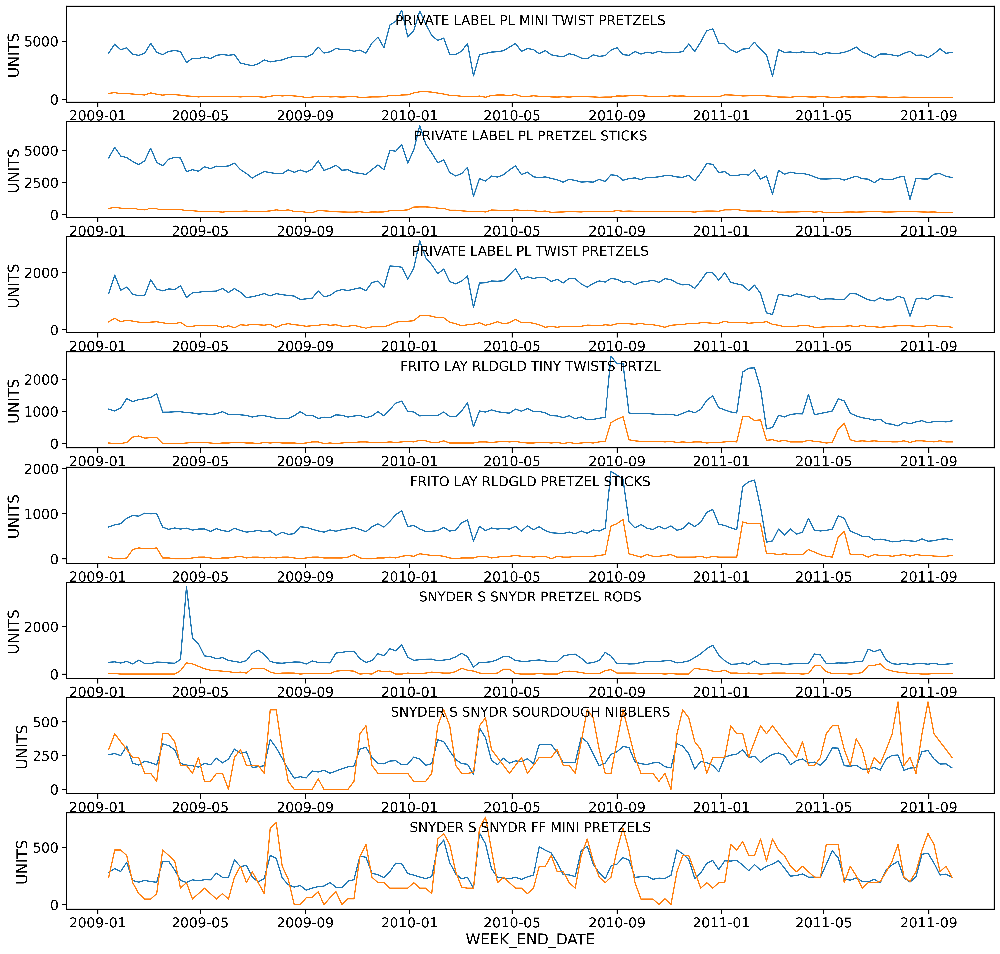

In [8]:
display_plots(product_list_f)

Does the in-store Feature also have a similar effect?

In [9]:
def featured_plots(product_list):
    #dictionary storing UPC and 'Featured' variable
    d_f = {product: 1000*train[train['UPC'] == product].groupby(['WEEK_END_DATE'])['FEATURE'].mean() for product in product_list}
    #dictionary storing UPC and Product Sales
    d = {product: train[train['UPC'] == product].groupby(['WEEK_END_DATE'])['UNITS'].sum() for product in product_list}
    
    
    fig, axs = plt.subplots(len(product_list), 1, figsize = (20, 20), dpi=300)
    j = 0
    for product in d.keys():
        # Manufacturer name and Descritption in title
        manu = product_data[product_data['UPC'] == product]['MANUFACTURER'].values[0]
        desc = product_data[product_data['UPC'] == product]['DESCRIPTION'].values[0]
        
        # plotting featured and sales values
        sns.lineplot(x = d_f[product].index, y = d_f[product],ax = axs[j]).set_title(str(manu)+str(" ")+str(desc), y=0.75, fontsize = 16)
        sns.lineplot(x = d[product].index, y = d[product],ax = axs[j]).set_title(str(manu)+str(" ")+str(desc), y=0.75, fontsize = 16)
        j = j+1

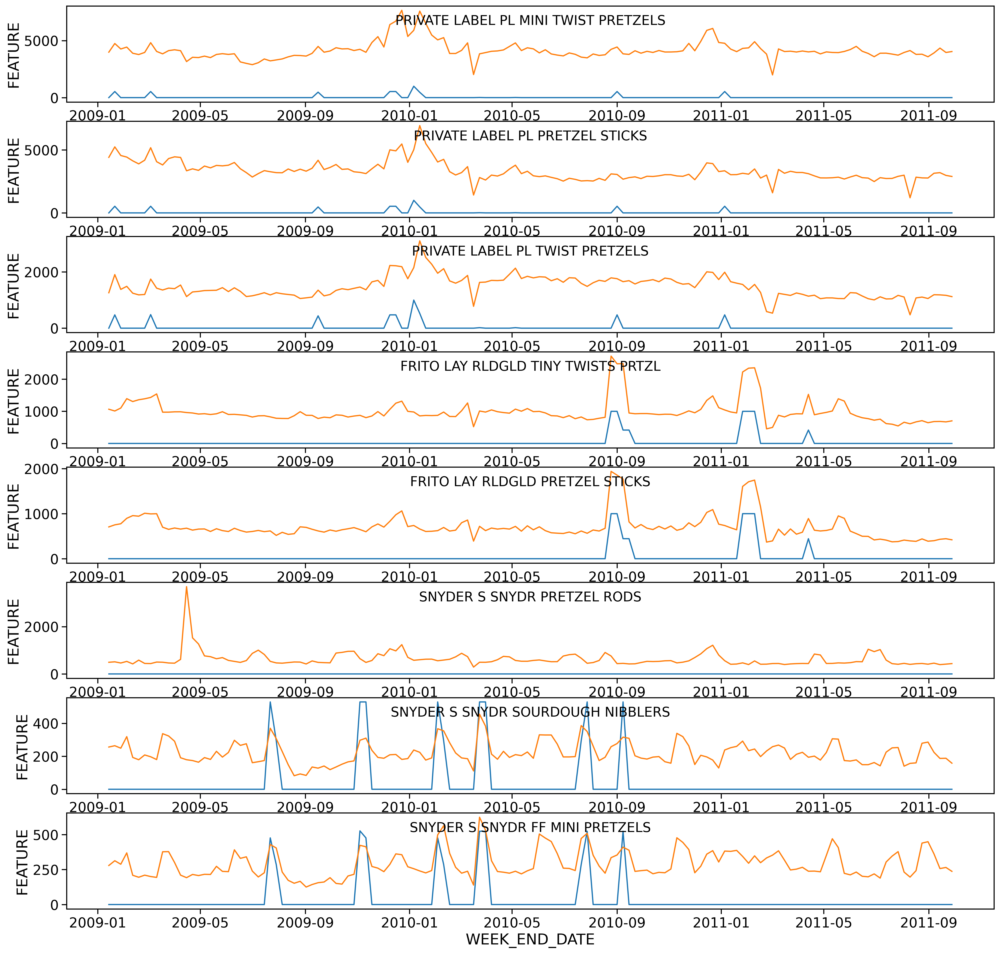

In [10]:
featured_plots(product_list_f)

*When the products are featured, the sales increase.*

- It is evident that product sales are greatly affected by the display.
- For products on display, the sales are higher.

### 3.2 Does the number of unique manufacturers for a category & subcategory (Bag snacks, Frozen Pizza etc.) impact the demand?

Now, we will look at category wise sales or demand patterns to see if there is any similarity within each category

In [11]:
# function to plot weekly sales of products
def product_plots(product_list):
    
    # dictionary storing UPC and weekly sales
    d = {product: store_product_data[store_product_data['UPC'] == product].groupby(['WEEK_END_DATE'])['UNITS'].sum() for product in product_list}
    fig, axs = plt.subplots(len(product_list), 1, figsize = (20, 20), dpi=300)
    j = 0
    
    for product in d.keys():
        # adding manufacturer and descritption in title
        manu = product_data[product_data['UPC'] == product]['MANUFACTURER'].values[0]
        desc = product_data[product_data['UPC'] == product]['DESCRIPTION'].values[0]            
        # creating the plot
        sns.lineplot(x = d[product].index, y = d[product],ax = axs[j]).set_title(str(manu)+str(" ")+str(desc), y=0.75, fontsize = 16)
        j = j+1
    plt.tight_layout()

In [12]:
store_product_data = train.merge(product_data, how = 'left', on='UPC')

store_product_data = store_product_data.merge(store_data, how = 'left', left_on = 'STORE_NUM', right_on = 'STORE_ID')

In [13]:
store_product_data.shape

(232287, 22)

In [14]:
store_product_data.columns

Index(['WEEK_END_DATE', 'STORE_NUM', 'UPC', 'PRICE', 'BASE_PRICE', 'FEATURE',
       'DISPLAY', 'UNITS', 'DESCRIPTION', 'MANUFACTURER', 'CATEGORY',
       'SUB_CATEGORY', 'PRODUCT_SIZE', 'STORE_ID', 'STORE_NAME',
       'ADDRESS_CITY_NAME', 'ADDRESS_STATE_PROV_CODE', 'MSA_CODE',
       'SEG_VALUE_NAME', 'PARKING_SPACE_QTY', 'SALES_AREA_SIZE_NUM',
       'AVG_WEEKLY_BASKETS'],
      dtype='object')

In [15]:
# creating list of products based on category
pretzels = list(product_data[product_data['CATEGORY'] == 'BAG SNACKS']['UPC'])
frozen_pizza = list(product_data[product_data['CATEGORY'] == 'FROZEN PIZZA']['UPC'])
oral_hygiene = list(product_data[product_data['CATEGORY'] == 'ORAL HYGIENE PRODUCTS']['UPC'])
cold_cereal = list(product_data[product_data['CATEGORY'] == 'COLD CEREAL']['UPC'])

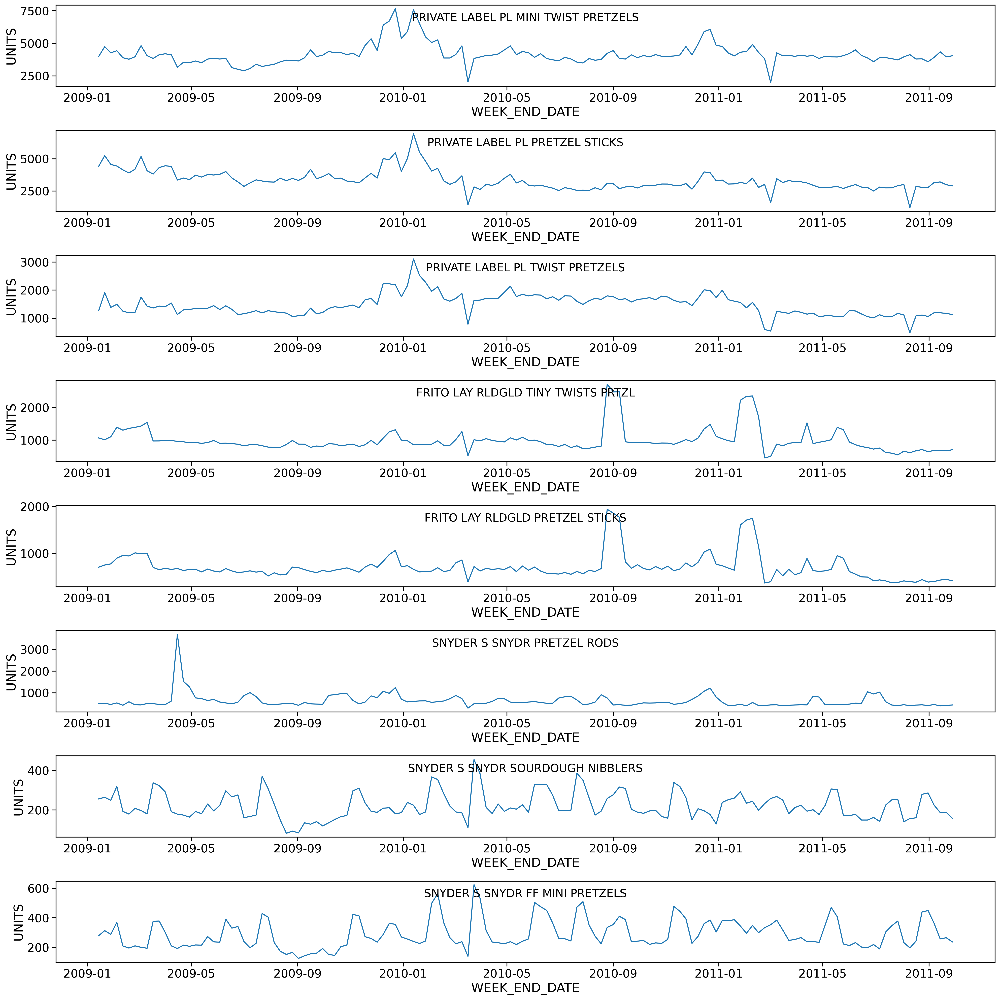

In [16]:
product_plots(pretzels)

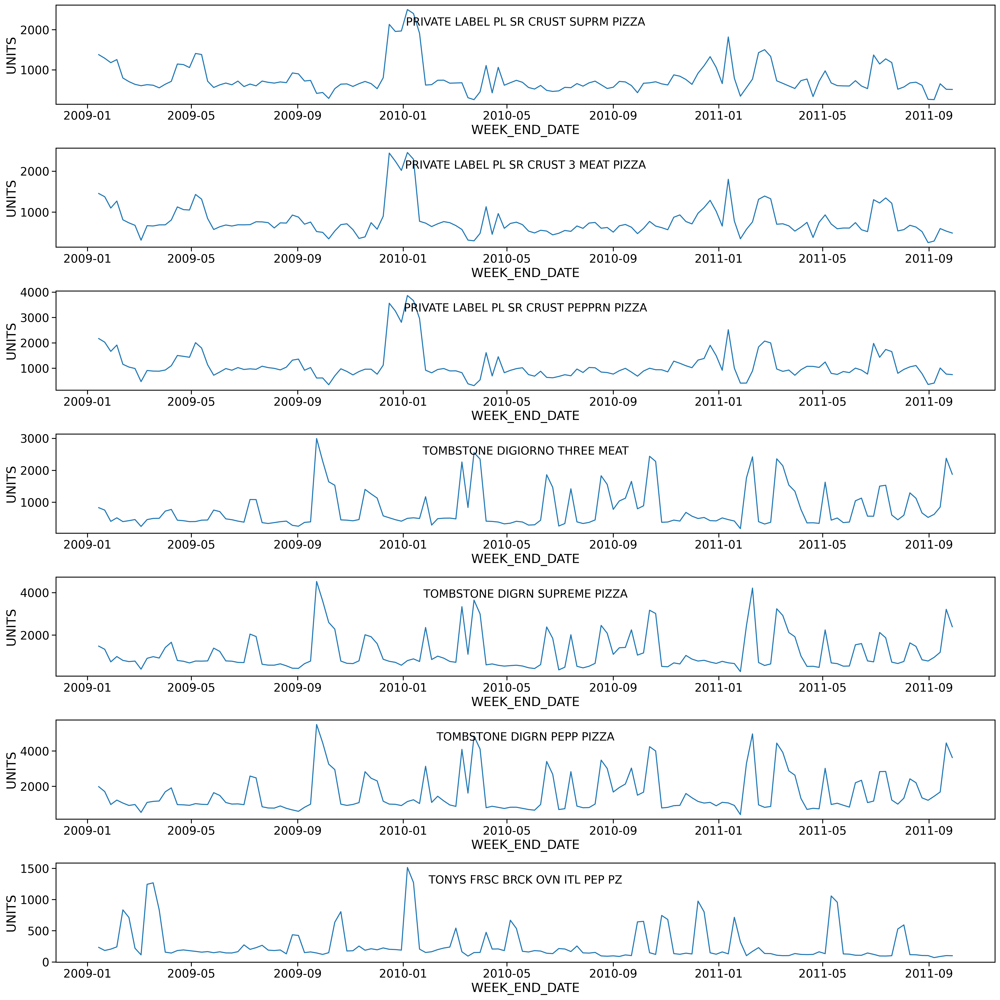

In [17]:
product_plots(frozen_pizza)

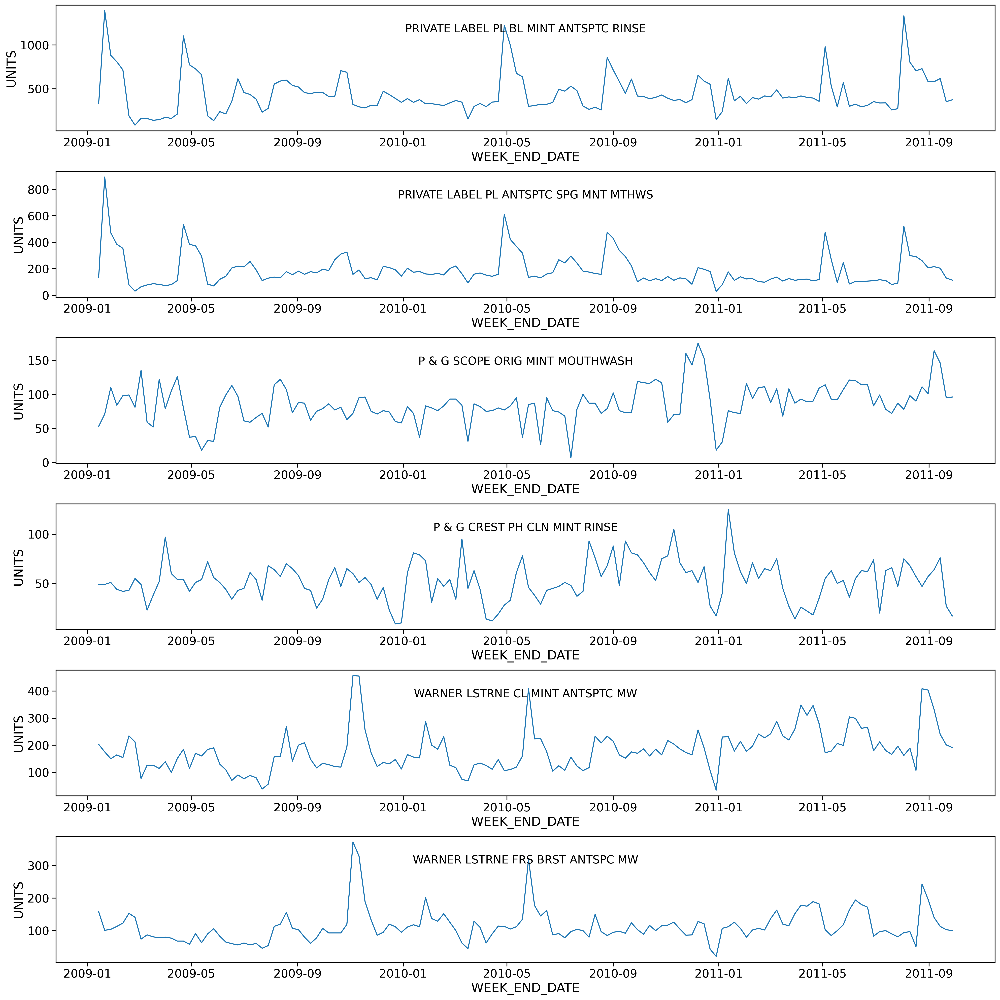

In [18]:
product_plots(oral_hygiene)

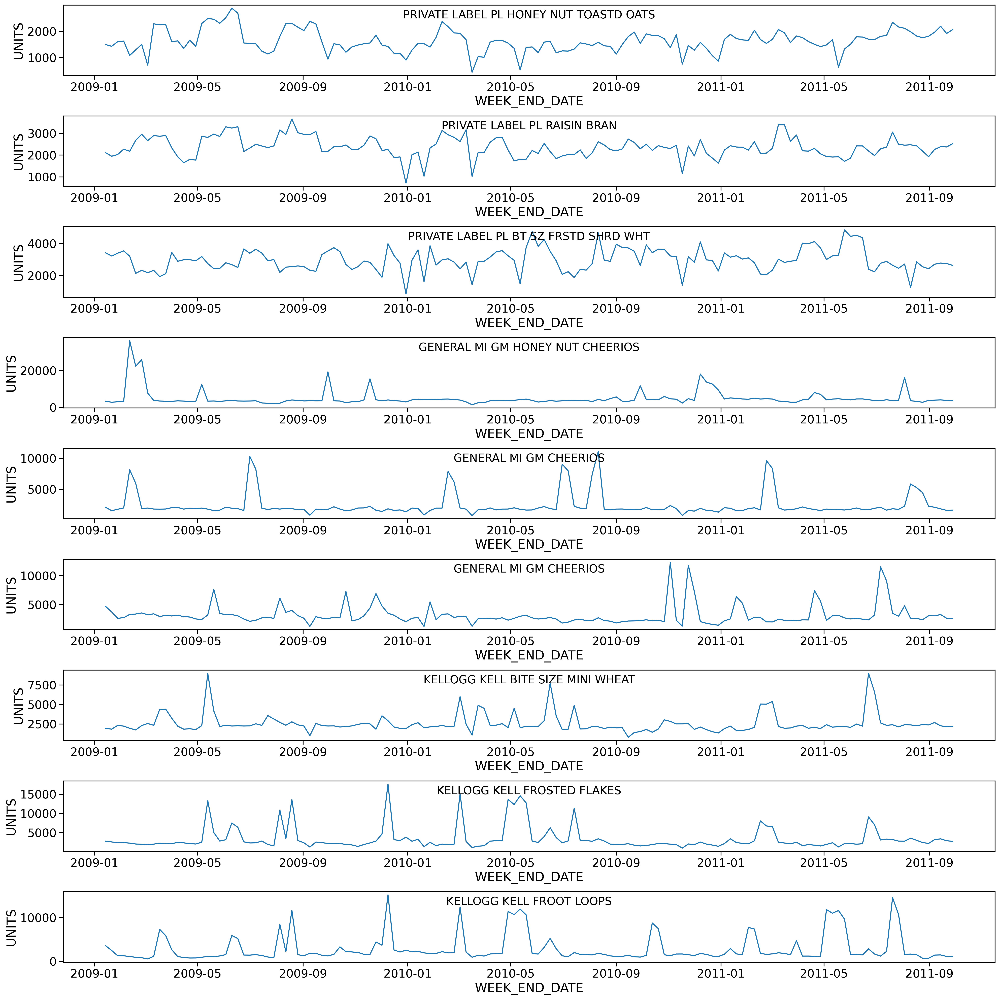

In [19]:
product_plots(cold_cereal)

- Products by same manufaturer have similar patterns (spikes and drops).

### 3.3  One hypothesis you think should be tested with the given dataset. Demonstrate with plots.

Quantity of product sold througth the years or months

In [20]:
train['YEAR'] = train['WEEK_END_DATE'].dt.year
train['MONTH'] = train['WEEK_END_DATE'].dt.month

In [21]:
train.head()

,WEEK_END_DATE,STORE_NUM,UPC,PRICE,BASE_PRICE,FEATURE,DISPLAY,UNITS,YEAR,MONTH
0,2009-01-14,367,1111009477,1.39,1.57,0,0,13,2009,1
1,2009-01-14,367,1111009497,1.39,1.39,0,0,20,2009,1
2,2009-01-14,367,1111085319,1.88,1.88,0,0,14,2009,1
3,2009-01-14,367,1111085345,1.88,1.88,0,0,29,2009,1
4,2009-01-14,367,1111085350,1.98,1.98,0,0,35,2009,1


#### Merging the Store and Product Datasets

In [22]:
store_product_data = train.merge(product_data, how = 'left', on='UPC')

store_product_data = store_product_data.merge(store_data, how = 'left', left_on = 'STORE_NUM', right_on = 'STORE_ID')

In [23]:
store_product_data.shape

(232287, 24)

In [24]:
store_product_data.head()

,WEEK_END_DATE,STORE_NUM,UPC,PRICE,BASE_PRICE,FEATURE,DISPLAY,UNITS,YEAR,MONTH,DESCRIPTION,MANUFACTURER,CATEGORY,SUB_CATEGORY,PRODUCT_SIZE,STORE_ID,STORE_NAME,ADDRESS_CITY_NAME,ADDRESS_STATE_PROV_CODE,MSA_CODE,SEG_VALUE_NAME,PARKING_SPACE_QTY,SALES_AREA_SIZE_NUM,AVG_WEEKLY_BASKETS
0,2009-01-14,367,1111009477,1.39,1.57,0,0,13,2009,1,PL MINI TWIST PRETZELS,PRIVATE LABEL,BAG SNACKS,PRETZELS,15 OZ,367,15TH & MADISON,COVINGTON,KY,17140,VALUE,196.0,24721,12707
1,2009-01-14,367,1111009497,1.39,1.39,0,0,20,2009,1,PL PRETZEL STICKS,PRIVATE LABEL,BAG SNACKS,PRETZELS,15 OZ,367,15TH & MADISON,COVINGTON,KY,17140,VALUE,196.0,24721,12707
2,2009-01-14,367,1111085319,1.88,1.88,0,0,14,2009,1,PL HONEY NUT TOASTD OATS,PRIVATE LABEL,COLD CEREAL,ALL FAMILY CEREAL,12.25 OZ,367,15TH & MADISON,COVINGTON,KY,17140,VALUE,196.0,24721,12707
3,2009-01-14,367,1111085345,1.88,1.88,0,0,29,2009,1,PL RAISIN BRAN,PRIVATE LABEL,COLD CEREAL,ADULT CEREAL,20 OZ,367,15TH & MADISON,COVINGTON,KY,17140,VALUE,196.0,24721,12707
4,2009-01-14,367,1111085350,1.98,1.98,0,0,35,2009,1,PL BT SZ FRSTD SHRD WHT,PRIVATE LABEL,COLD CEREAL,ALL FAMILY CEREAL,18 OZ,367,15TH & MADISON,COVINGTON,KY,17140,VALUE,196.0,24721,12707


In [25]:
store_product_data.columns

Index(['WEEK_END_DATE', 'STORE_NUM', 'UPC', 'PRICE', 'BASE_PRICE', 'FEATURE',
       'DISPLAY', 'UNITS', 'YEAR', 'MONTH', 'DESCRIPTION', 'MANUFACTURER',
       'CATEGORY', 'SUB_CATEGORY', 'PRODUCT_SIZE', 'STORE_ID', 'STORE_NAME',
       'ADDRESS_CITY_NAME', 'ADDRESS_STATE_PROV_CODE', 'MSA_CODE',
       'SEG_VALUE_NAME', 'PARKING_SPACE_QTY', 'SALES_AREA_SIZE_NUM',
       'AVG_WEEKLY_BASKETS'],
      dtype='object')

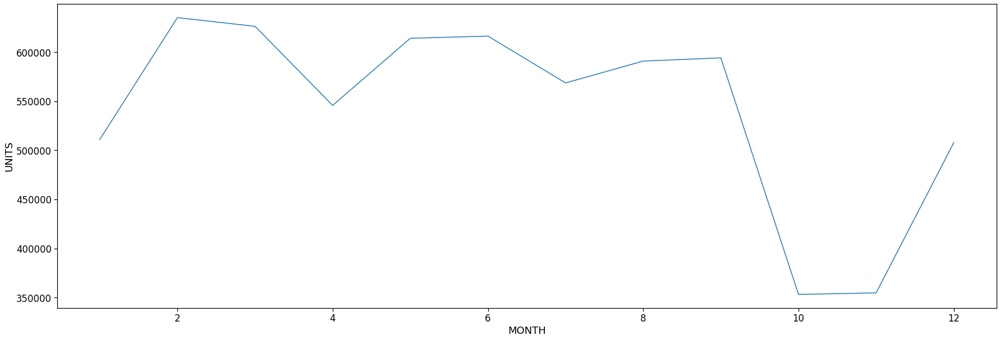

In [26]:
#sum of units sold per MONTH
month_demand = store_product_data.groupby(['MONTH'])['UNITS'].sum()

plt.figure(figsize=(30,10))
sns.lineplot(x = month_demand.index, y = month_demand)

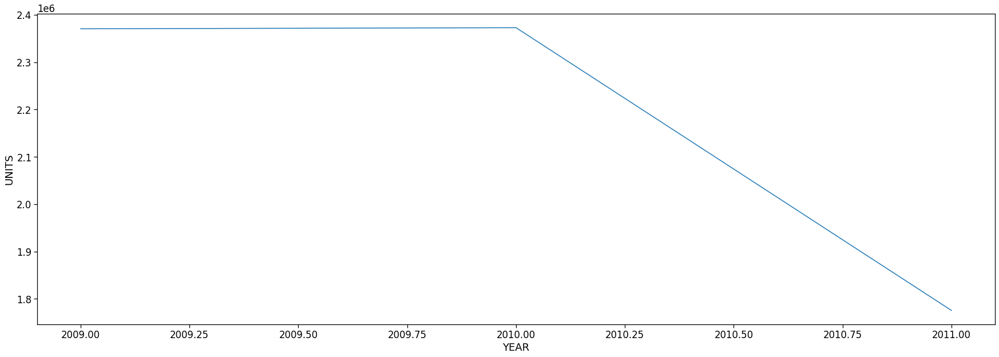

In [27]:
#sum of units sold per year
year_demand = store_product_data.groupby(['YEAR'])['UNITS'].sum()

plt.figure(figsize=(30,10))
sns.lineplot(x = year_demand.index, y = year_demand)

 - We clear see a decay of sales in october and november month
 - The sales fell absurdly from 2010 to 2011